<a href="https://colab.research.google.com/github/huyanhdo/transfer_learning_for_time_series/blob/main/transfer_learning_for_time_series.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!rm -rf '/content/transfer_learning_for_time_series'

In [ ]:
!rm -rf '/content/data for tf'

In [1]:
!git clone https://github.com/huyanhdo/transfer_learning_for_time_series.git  

Cloning into 'transfer_learning_for_time_series'...
remote: Enumerating objects: 21, done.
remote: Counting objects: 100% (21/21), done.
remote: Compressing objects: 100% (19/19), done.
remote: Total 21 (delta 3), reused 0 (delta 0), pack-reused 0
Unpacking objects: 100% (21/21), done.


In [2]:
!unzip "/content/transfer_learning_for_time_series/data for tf.zip"

Archive:  /content/transfer_learning_for_time_series/data for tf.zip
   creating: data for tf/large/
  inflating: data for tf/large/^IXIC.csv  
  inflating: data for tf/large/DJI.csv  
  inflating: data for tf/large/GSPC.csv  
   creating: data for tf/medium/
  inflating: data for tf/medium/^FCHI.csv  
  inflating: data for tf/medium/^GDAXI.csv  
  inflating: data for tf/medium/FTSE.csv  
   creating: data for tf/small/
  inflating: data for tf/small/^HSNC.csv  
  inflating: data for tf/small/^HSNF.csv  
  inflating: data for tf/small/^HSNP.csv  


In [ ]:
# !nvidia-smi -L  

In [3]:
import torch
import numpy as np
import pandas as pd
import os 
import torch.nn as nn 
import torch.optim as optim
import matplotlib.pyplot as plt
# import random
# import math
import sys
import torch.utils.data as loader
from sklearn.model_selection import train_test_split

In [4]:
# Hyperparameter
# random.seed(32)
device = 'cuda' if torch.cuda.is_available() else 'cpu'
epochs = 100
batch_size = 200
lr = 0.001
fine_tune_lr = 0.00001
first_moment = 0.9
second_moment = 0.999
input_size = 90
hidden_size = 256

In [5]:
# small
HSNC = pd.read_csv("/content/data for tf/small/^HSNC.csv")
HSNP = pd.read_csv("/content/data for tf/small/^HSNP.csv")
HSNF = pd.read_csv("/content/data for tf/small/^HSNF.csv")
# medium
DAX = pd.read_csv("/content/data for tf/medium/^GDAXI.csv")
CAC = pd.read_csv("/content/data for tf/medium/^FCHI.csv")
FTSE = pd.read_csv("/content/data for tf/medium/FTSE.csv")
#large
GSPC = pd.read_csv("/content/data for tf/large/GSPC.csv")
IXIC = pd.read_csv("/content/data for tf/large/^IXIC.csv")
DJI = pd.read_csv("/content/data for tf/large/DJI.csv")

In [6]:
data = [HSNC,HSNP,HSNF,DAX,CAC,FTSE,GSPC,IXIC,DJI]

In [7]:
def check_df_shape(data):
  for i in data:
    print(i.shape)
check_df_shape(data)

(984, 7)
(984, 7)
(984, 7)
(5009, 7)
(5169, 7)
(4024, 5)
(9925, 7)
(9925, 7)
(7638, 7)


In [8]:
# Giữ lại cột date và cột close
for i in data:
  if i.shape[1] == 7:
    i.drop(['Open','Low',"High","Adj Close","Volume"],axis = 1,inplace = True)
  else:
    i.drop(['Open ',"High ",'Low'],axis = 1,inplace = True)

In [9]:
#drop Null Value and transform dtype to float 64
for idx,i in enumerate(data):
  i.dropna(axis=0,inplace = True)
  i.astype({'Close':'float64'})
  i.reset_index(drop = True,inplace = True)
check_df_shape(data)

(984, 2)
(984, 2)
(984, 2)
(4984, 2)
(5151, 2)
(4024, 2)
(9925, 2)
(9925, 2)
(7638, 2)


In [ ]:
# data[4].to_csv('./hanh.csv')

In [ ]:
# data[0].tail(10)

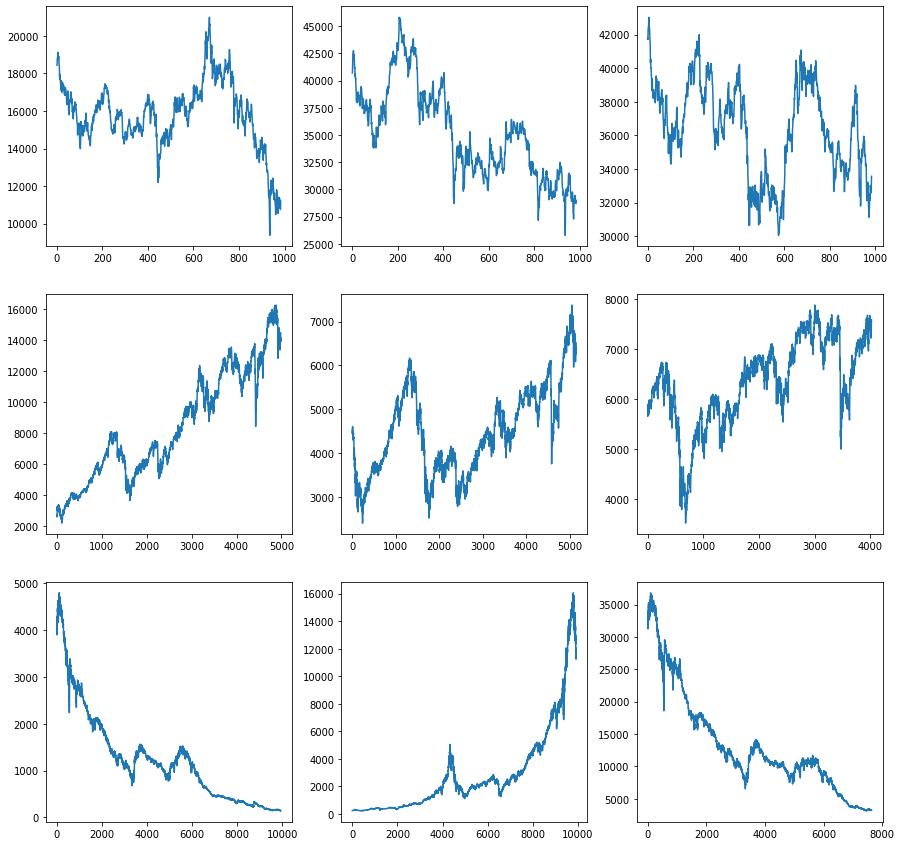

In [10]:
fig,ax = plt.subplots(3,3,figsize=(15, 15),sharex = False,sharey = False)
for i,axis in (zip(data,ax.ravel())):
  y = i.iloc[:,1:2].values
  axis.plot(y)
plt.show()

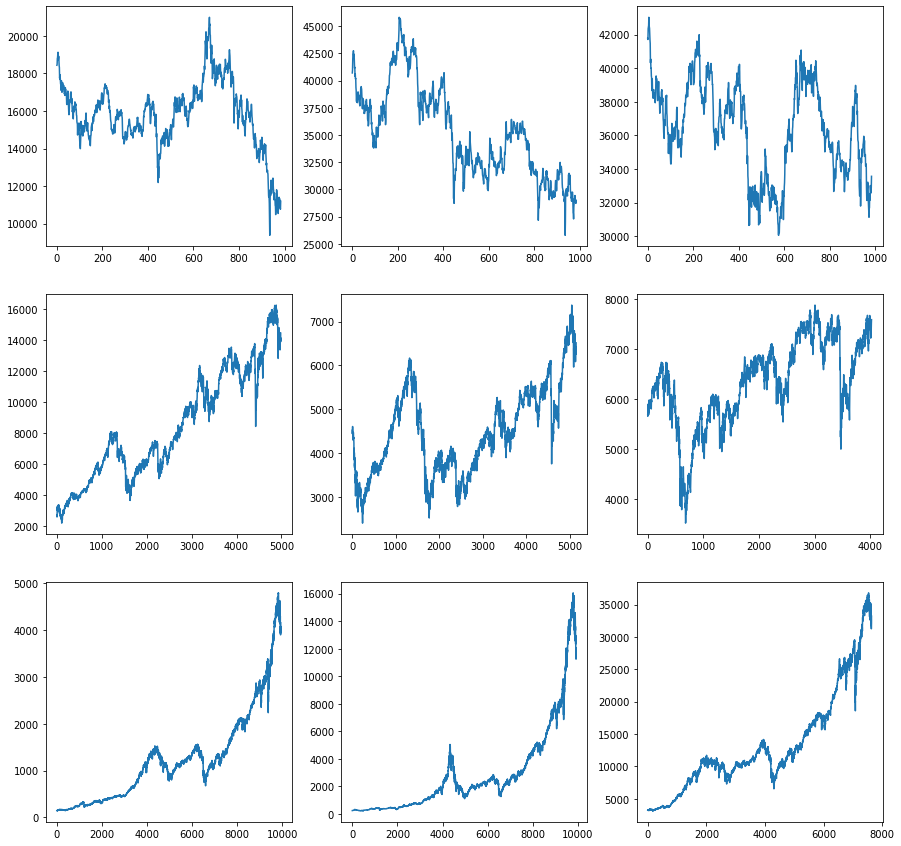

In [11]:
# 2 tk bi nguoc nen phai dao lai 
data[6] = data[6].iloc[::-1]
data[8] = data[8].iloc[::-1]
fig,ax = plt.subplots(3,3,figsize=(15, 15),sharex = False,sharey = False)
for i,axis in (zip(data,ax.ravel())):
  y = i.iloc[:,1:2].values
  axis.plot(y)
plt.show()

In [12]:
# normalize data to (-1,1)
mi = []
ma = []
for i in data:
  min = i.min()['Close']
  max = i.max()['Close']
  mi.append(min)
  ma.append(max)
  i['Close'] = -1 + (i['Close'] - min) * 2 / (max - min)

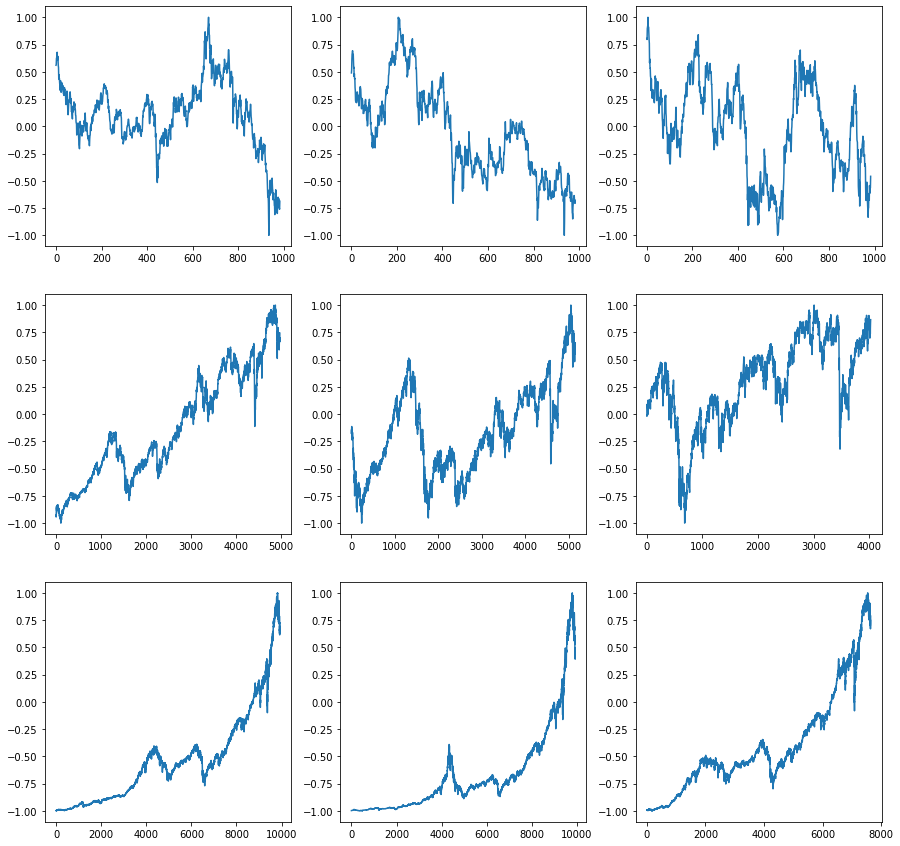

In [13]:
# đồ thị sau khi min max scale
fig,ax = plt.subplots(3,3,figsize=(15, 15),sharex = False,sharey = False)
for i,axis in (zip(data,ax.ravel())):
  y = i.iloc[:,1:2].values
  axis.plot(y)
plt.show()

In [14]:
def inverse_normalize_data(data,index,mi,ma):
  return (data + 1)*(ma[index] - mi[index])/2 +mi[index]

In [ ]:
# print(data[0].min()['Close'])

In [15]:
#data loader de train bang batch
class dataset(loader.Dataset):
  def __init__(self,x,y):
    self.x = x
    self.y = y
  
  def __getitem__(self,index):
    return (self.x[index],self.y[index])

  def __len__(self):
    return len(self.x)     

In [16]:
def format_data(data,train_size = 0):
  y = []
  labels = []
  for i in range(89,data.shape[0]-1):
    x = []
    for j in reversed(range(i-89,i+1)):  
      x.append(np.float(data.iloc[j,1:2].values))
    y.append(x)
    labels.append(data.iloc[i+1,1:2].values)
  y = np.array(y,dtype = float)
  labels = np.array(labels,dtype = float)
  if(train_size == 0):
    y = torch.FloatTensor(y)
    labels = torch.FloatTensor(labels)
    res = dataset(y,labels)
    return res

  else:
    y_train,y_test,labels_train,labels_test = train_test_split(y,labels,train_size = train_size)
    
    y_train = torch.FloatTensor(y_train)
    labels_train = torch.FloatTensor(labels_train)
    train = dataset(y_train,labels_train)

    y_test = torch.FloatTensor(y_test)
    labels_test = torch.FloatTensor(labels_test)
    test = dataset(y_test,labels_test)

    return train,test

Small


In [17]:
small_source_1 = format_data(data[0])
small_source_2 = format_data(data[1])
small_target_train,small_target_test = format_data(data[2],train_size = 0.7)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  import sys


In [18]:
small_source_1_loader = loader.DataLoader(dataset = small_source_1, batch_size = batch_size)
small_source_2_loader = loader.DataLoader(dataset = small_source_2, batch_size = batch_size)
small_target_train_loader = loader.DataLoader(dataset = small_target_train, batch_size = batch_size)
small_target_test_loader = loader.DataLoader(dataset = small_target_test, batch_size = batch_size)

In [ ]:
# # ex = iter(small_source_1_loader)
# # a,b = next(ex)
# # print(b)
# print(small_source_1.x.shape,small_source_1.y.shape)
# print(small_source_2.x.shape,small_source_2.y.shape)
# print(small_target_train.x.shape,small_target_train.y.shape)
# print(small_target_test.x.shape,small_target_test.y.shape)

Medium

In [19]:
medium_source_1 = format_data(data[3])
medium_source_2 = format_data(data[4])
medium_target_train,medium_target_test = format_data(data[5],train_size = 0.7)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  import sys


In [20]:
medium_source_1_loader = loader.DataLoader(dataset = medium_source_1, batch_size = batch_size)
medium_source_2_loader = loader.DataLoader(dataset = medium_source_2, batch_size = batch_size)
medium_target_train_loader = loader.DataLoader(dataset = medium_target_train, batch_size = batch_size)
medium_target_test_loader = loader.DataLoader(dataset = medium_target_test, batch_size = batch_size)

Large



In [21]:
large_source_1 = format_data(data[6])
large_source_2 = format_data(data[7])
large_target_train,large_target_test = format_data(data[8],train_size = 0.7)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  import sys


In [22]:
large_source_1_loader = loader.DataLoader(dataset = large_source_1, batch_size = batch_size)
large_source_2_loader = loader.DataLoader(dataset = large_source_2, batch_size = batch_size)
large_target_train_loader = loader.DataLoader(dataset = large_target_train, batch_size = batch_size)
large_target_test_loader = loader.DataLoader(dataset = large_target_test, batch_size = batch_size)

Model 

In [23]:
class ANN(nn.Module):
  def __init__(self,input_size,hidden_size):
    super(ANN,self).__init__()
    self.FC1 = nn.Linear(input_size,hidden_size)
    self.Tanh1 = nn.Tanh()
    self.FC2 = nn.Linear(hidden_size,hidden_size)
    self.Tanh2 = nn.Tanh()
    self.FC3 = nn.Linear(hidden_size,1)

  def forward(self,x):
    x = self.FC1(x)
    x = self.Tanh1(x)
    x = self.FC2(x)
    x = self.Tanh2(x)
    x = self.FC3(x)
    return x

In [24]:
class LSTM(nn.Module):
  def __init__(self,input_size,hidden_size,num_layers):
    super(LSTM,self).__init__()
    self.hidden_size = hidden_size
    self.num_layers = num_layers
    self.input_size = input_size
    
    self.LSTM_layer = nn.LSTM(input_size = self.input_size,hidden_size = self.hidden_size,num_layers = self.num_layers,batch_first = True)
    self.out = nn.Linear(hidden_size,1)
    
  def forward(self,x):
    c_in = torch.zeros(self.num_layers,x.size(0),self.hidden_size).to(device)
    h_in = torch.zeros(self.num_layers,x.size(0),self.hidden_size).to(device)
  
    out,(h_out,_) = self.LSTM_layer(x,(h_in,c_in))
    out = out[:,-1,:]
    h_out = self.out(out)
    return h_out

metric

In [25]:
def R2(actual_value,predicted_value):
    mean = torch.mean(actual_value)
    ss_tot = torch.sum((actual_value - mean) ** 2)
    ss_res = torch.sum((actual_value - predicted_value) ** 2)
    R2 = 1 - ss_res / ss_tot
    return R2

In [26]:
def RMSE(actual_value,predicted_value):
  res = torch.sum((actual_value-predicted_value)**2)/actual_value.shape[0]
  RMSE = torch.sqrt(res)
  return RMSE

In [27]:
def MAPE(actual_value,predicted_value):
  res = torch.sum(torch.abs((actual_value-predicted_value)/predicted_value))
  MAPE = 100*res/actual_value.shape[0]
  return MAPE

In [28]:
loss_function = nn.CrossEntropyLoss()

M1: only target data (no transfer learning)

In [29]:
#small
M1_ANN_small = ANN(input_size = input_size,hidden_size = hidden_size).to(device)
M1_LSTM_small = LSTM(input_size = 1,hidden_size = hidden_size,num_layers = 2).to(device)
# print(M1_ANN)
optimizer_ANN_M1_small = optim.Adam(M1_ANN_small.parameters(), lr=lr)
optimizer_LSTM_M1_small = optim.Adam(M1_LSTM_small.parameters(), lr=lr)

In [30]:
#medium
M1_ANN_medium = ANN(input_size = input_size,hidden_size = hidden_size).to(device)
M1_LSTM_medium = LSTM(input_size = 1,hidden_size = hidden_size,num_layers = 2).to(device)

optimizer_ANN_M1_medium = optim.Adam(M1_ANN_medium.parameters(), lr=lr)
optimizer_LSTM_M1_medium = optim.Adam(M1_LSTM_medium.parameters(), lr=lr)

In [31]:
#large
M1_ANN_large = ANN(input_size = input_size,hidden_size = hidden_size).to(device)
M1_LSTM_large = LSTM(input_size = 1,hidden_size = hidden_size,num_layers = 2).to(device)

optimizer_ANN_M1_large = optim.Adam(M1_ANN_large.parameters(), lr=lr)
optimizer_LSTM_M1_large = optim.Adam(M1_LSTM_large.parameters(), lr=lr)

M2: Pretrain using source 1, fine tune using target_set

In [32]:
#small
M2_ANN_small = ANN(input_size = input_size,hidden_size = hidden_size).to(device)
M2_LSTM_small = LSTM(input_size = 1,hidden_size = hidden_size,num_layers = 2).to(device)

optimizer_M2_ANN_pretrain_small = optim.Adam(M2_ANN_small.parameters(),lr = lr)
optimizer_M2_ANN_finetune_small = optim.Adam(M2_ANN_small.parameters(),lr = fine_tune_lr)

optimizer_M2_LSTM_pretrain_small = optim.Adam(M2_LSTM_small.parameters(),lr = lr)
optimizer_M2_LSTM_finetune_small = optim.Adam(M2_LSTM_small.parameters(),lr = fine_tune_lr)

In [33]:
#medium
M2_ANN_medium = ANN(input_size = input_size,hidden_size = hidden_size).to(device)
M2_LSTM_medium = LSTM(input_size = 1,hidden_size = hidden_size,num_layers = 2).to(device)

optimizer_M2_ANN_pretrain_medium = optim.Adam(M2_ANN_medium.parameters(),lr = lr)
optimizer_M2_ANN_finetune_medium = optim.Adam(M2_ANN_medium.parameters(),lr = fine_tune_lr)

optimizer_M2_LSTM_pretrain_medium = optim.Adam(M2_LSTM_medium.parameters(),lr = lr)
optimizer_M2_LSTM_finetune_medium = optim.Adam(M2_LSTM_medium.parameters(),lr = fine_tune_lr)

In [34]:
#large
M2_ANN_large = ANN(input_size = input_size,hidden_size = hidden_size).to(device)
M2_LSTM_large = LSTM(input_size = 1,hidden_size = hidden_size,num_layers = 2).to(device)

optimizer_M2_ANN_pretrain_large = optim.Adam(M2_ANN_large.parameters(),lr = lr)
optimizer_M2_ANN_finetune_large = optim.Adam(M2_ANN_large.parameters(),lr = fine_tune_lr)

optimizer_M2_LSTM_pretrain_large = optim.Adam(M2_LSTM_large.parameters(),lr = lr)
optimizer_M2_LSTM_finetune_large = optim.Adam(M2_LSTM_large.parameters(),lr = fine_tune_lr)

M3: pre train using source 2, finetune using target set

In [35]:
#small
M3_ANN_small = ANN(input_size = input_size,hidden_size = hidden_size).to(device)
M3_LSTM_small = LSTM(input_size = 1,hidden_size = hidden_size,num_layers = 2).to(device)

optimizer_M3_ANN_pretrain_small = optim.Adam(M3_ANN_small.parameters(),lr = lr)
optimizer_M3_ANN_finetune_small = optim.Adam(M3_ANN_small.parameters(),lr = fine_tune_lr)

optimizer_M3_LSTM_pretrain_small = optim.Adam(M3_LSTM_small.parameters(),lr = lr)
optimizer_M3_LSTM_finetune_small = optim.Adam(M3_LSTM_small.parameters(),lr = fine_tune_lr)

In [36]:
#medium
M3_ANN_medium = ANN(input_size = input_size,hidden_size = hidden_size).to(device)
M3_LSTM_medium = LSTM(input_size = 1,hidden_size = hidden_size,num_layers = 2).to(device)

optimizer_M3_ANN_pretrain_medium = optim.Adam(M3_ANN_medium.parameters(),lr = lr)
optimizer_M3_ANN_finetune_medium = optim.Adam(M3_ANN_medium.parameters(),lr = fine_tune_lr)

optimizer_M3_LSTM_pretrain_medium = optim.Adam(M3_LSTM_medium.parameters(),lr = lr)
optimizer_M3_LSTM_finetune_medium = optim.Adam(M3_LSTM_medium.parameters(),lr = fine_tune_lr)

In [37]:
#large
M3_ANN_large = ANN(input_size = input_size,hidden_size = hidden_size).to(device)
M3_LSTM_large = LSTM(input_size = 1,hidden_size = hidden_size,num_layers = 2).to(device)

optimizer_M3_ANN_pretrain_large = optim.Adam(M3_ANN_large.parameters(),lr = lr)
optimizer_M3_ANN_finetune_large = optim.Adam(M3_ANN_large.parameters(),lr = fine_tune_lr)

optimizer_M3_LSTM_pretrain_large = optim.Adam(M3_LSTM_large.parameters(),lr = lr)
optimizer_M3_LSTM_finetune_large = optim.Adam(M3_LSTM_large.parameters(),lr = fine_tune_lr)

M4: pretrain with source 1 and 2, finetune with test


In [38]:
#small
M4_ANN_small = ANN(input_size = input_size,hidden_size = hidden_size).to(device)
M4_LSTM_small = LSTM(input_size = 1,hidden_size = hidden_size,num_layers = 2).to(device)

optimizer_M4_ANN_pretrain_1_small = optim.Adam(M4_ANN_small.parameters(),lr = lr)
optimizer_M4_ANN_pretrain_2_small = optim.Adam(M4_ANN_small.parameters(),lr = lr)
optimizer_M4_ANN_finetune_small = optim.Adam(M4_ANN_small.parameters(),lr = fine_tune_lr)

optimizer_M4_LSTM_pretrain_1_small = optim.Adam(M4_LSTM_small.parameters(),lr = lr)
optimizer_M4_LSTM_pretrain_2_small = optim.Adam(M4_LSTM_small.parameters(),lr = lr)
optimizer_M4_LSTM_finetune_small = optim.Adam(M4_LSTM_small.parameters(),lr = fine_tune_lr)

In [39]:
#medium
M4_ANN_medium = ANN(input_size = input_size,hidden_size = hidden_size).to(device)
M4_LSTM_medium = LSTM(input_size = 1,hidden_size = hidden_size,num_layers = 2).to(device)

optimizer_M4_ANN_pretrain_1_medium = optim.Adam(M4_ANN_medium.parameters(),lr = lr)
optimizer_M4_ANN_pretrain_2_medium = optim.Adam(M4_ANN_medium.parameters(),lr = lr)
optimizer_M4_ANN_finetune_medium = optim.Adam(M4_ANN_medium.parameters(),lr = fine_tune_lr)

optimizer_M4_LSTM_pretrain_1_medium = optim.Adam(M4_LSTM_medium.parameters(),lr = lr)
optimizer_M4_LSTM_pretrain_2_medium = optim.Adam(M4_LSTM_medium.parameters(),lr = lr)
optimizer_M4_LSTM_finetune_medium = optim.Adam(M4_LSTM_medium.parameters(),lr = fine_tune_lr)

In [40]:
#large
M4_ANN_large = ANN(input_size = input_size,hidden_size = hidden_size).to(device)
M4_LSTM_large = LSTM(input_size = 1,hidden_size = hidden_size,num_layers = 2).to(device)

optimizer_M4_ANN_pretrain_1_large = optim.Adam(M4_ANN_large.parameters(),lr = lr)
optimizer_M4_ANN_pretrain_2_large = optim.Adam(M4_ANN_large.parameters(),lr = lr)
optimizer_M4_ANN_finetune_large = optim.Adam(M4_ANN_large.parameters(),lr = fine_tune_lr)

optimizer_M4_LSTM_pretrain_1_large = optim.Adam(M4_LSTM_large.parameters(),lr = lr)
optimizer_M4_LSTM_pretrain_2_large = optim.Adam(M4_LSTM_large.parameters(),lr = lr)
optimizer_M4_LSTM_finetune_large = optim.Adam(M4_LSTM_large.parameters(),lr = fine_tune_lr)

M5: apply proposed strategy

In [41]:
#small
M5_ANN_small = ANN(input_size = input_size,hidden_size = hidden_size).to(device)
M5_LSTM_small = LSTM(input_size = 1,hidden_size = hidden_size,num_layers = 2).to(device)

optimizer_M5_ANN_pretrain_1_small = optim.Adam(M5_ANN_small.parameters(),lr = lr)
optimizer_M5_ANN_pretrain_2_small = optim.Adam(M5_ANN_small.parameters(),lr = lr)
optimizer_M5_ANN_finetune_small = optim.Adam(M5_ANN_small.parameters(),lr = fine_tune_lr)

optimizer_M5_LSTM_pretrain_1_small = optim.Adam(M5_LSTM_small.parameters(),lr = lr)
optimizer_M5_LSTM_pretrain_2_small = optim.Adam(M5_LSTM_small.parameters(),lr = lr)
optimizer_M5_LSTM_finetune_small = optim.Adam(M5_LSTM_small.parameters(),lr = fine_tune_lr)

In [42]:
#medium
M5_ANN_medium = ANN(input_size = input_size,hidden_size = hidden_size).to(device)
M5_LSTM_medium = LSTM(input_size = 1,hidden_size = hidden_size,num_layers = 2).to(device)

optimizer_M5_ANN_pretrain_1_medium = optim.Adam(M5_ANN_medium.parameters(),lr = lr)
optimizer_M5_ANN_pretrain_2_medium = optim.Adam(M5_ANN_medium.parameters(),lr = lr)
optimizer_M5_ANN_finetune_medium = optim.Adam(M5_ANN_medium.parameters(),lr = fine_tune_lr)

optimizer_M5_LSTM_pretrain_1_medium = optim.Adam(M5_LSTM_medium.parameters(),lr = lr)
optimizer_M5_LSTM_pretrain_2_medium = optim.Adam(M5_LSTM_medium.parameters(),lr = lr)
optimizer_M5_LSTM_finetune_medium = optim.Adam(M5_LSTM_medium.parameters(),lr = fine_tune_lr)

In [43]:
#large
M5_ANN_large = ANN(input_size = input_size,hidden_size = hidden_size).to(device)
M5_LSTM_large = LSTM(input_size = 1,hidden_size = hidden_size,num_layers = 2).to(device)

optimizer_M5_ANN_pretrain_1_large = optim.Adam(M5_ANN_large.parameters(),lr = lr)
optimizer_M5_ANN_pretrain_2_large = optim.Adam(M5_ANN_large.parameters(),lr = lr)
optimizer_M5_ANN_finetune_large = optim.Adam(M5_ANN_large.parameters(),lr = fine_tune_lr)

optimizer_M5_LSTM_pretrain_1_large = optim.Adam(M5_LSTM_large.parameters(),lr = lr)
optimizer_M5_LSTM_pretrain_2_large = optim.Adam(M5_LSTM_large.parameters(),lr = lr)
optimizer_M5_LSTM_finetune_large = optim.Adam(M5_LSTM_large.parameters(),lr = fine_tune_lr)

Train

In [44]:
def train(optim,loss,train_data,model,type ='ann'):
  model.train()
  for epoch in range(epochs):
    for idx,(batch,label) in enumerate(train_data):
      batch.to(device)
      label.to(device)
      optim.zero_grad()
      if type == 'lstm':
        y_pred = model(batch.view(-1,90,1))
      else:
        y_pred = model(batch)
      l = loss(y_pred,label)

      l.backward()
      optim.step()
      # print(f'batch {idx}/{} epoch {epoch}/{epochs} loss{l}')


Test

In [45]:
def eval(loss1,loss2,loss3,test_data,model,idx,type = 'ann'):
  model.eval()
  predicts = torch.Tensor([])
  labels = torch.Tensor([])
  with torch.no_grad():
    for i,(batch,label) in enumerate(test_data):
      batch.to(device)
      label.to(device)
      if type == 'lstm':
        y_pred = model(batch.view(-1,90,1))
      else:
        y_pred = model(batch)
      for pred,lab in zip(y_pred,label):
        predicts = torch.cat((predicts,pred))
        labels = torch.cat((labels,lab))
  
  labels = inverse_normalize_data(labels,idx,mi,ma)
  predicts = inverse_normalize_data(predicts,idx,mi,ma)

  # for i in range(len(labels)):
  #   print(labels[i],predicts[i])

  # plt.figure(num = 3, figsize=(30, 5))
  # plt.plot(labels)
  # plt.plot(predicts,color='red')
  # plt.show()

  fig,ax = plt.subplots(3,1,figsize=(30, 20),sharex = False,sharey = False)
  ax.ravel()[0].plot(labels)
  ax.ravel()[1].plot(predicts)
  ax.ravel()[2].plot(labels)
  ax.ravel()[2].plot(predicts,color = 'red')
  plt.show()

  print(f"MAPE:{loss1(labels,predicts)} RMSE:{loss2(labels,predicts)} R2:{loss3(labels,predicts)}")

      # l = loss(y_pred,label)


M1

ANN

In [46]:
train(optimizer_ANN_M1_small,RMSE,small_target_train_loader,M1_ANN_small)

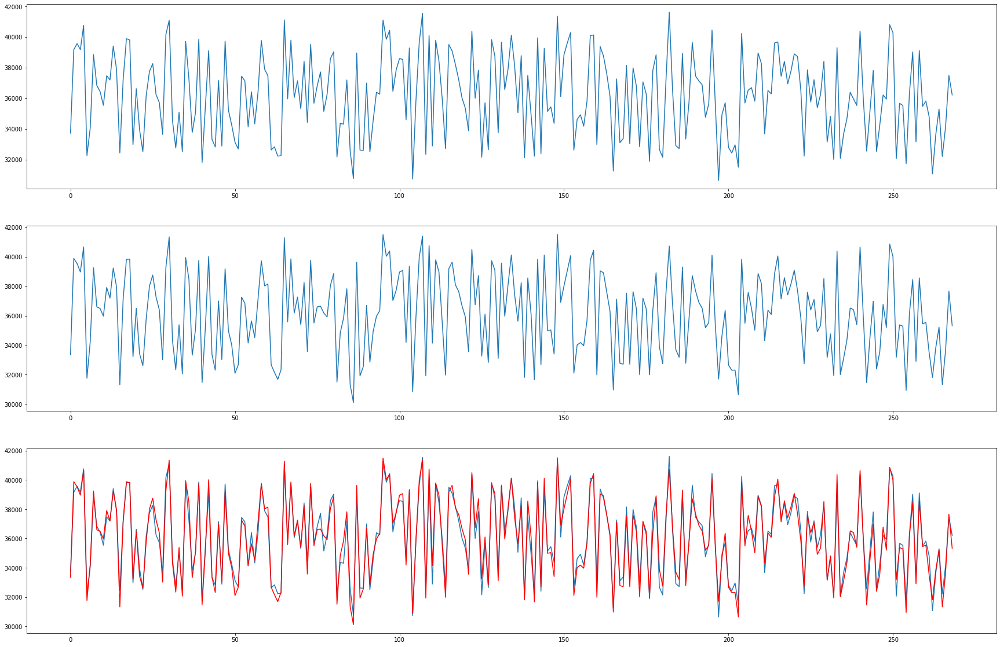

MAPE:1.1940406560897827 RMSE:534.831787109375 R2:0.9607968330383301


In [47]:
eval(MAPE,RMSE,R2,small_target_test_loader,M1_ANN_small,2)

In [48]:
train(optimizer_ANN_M1_medium ,RMSE,medium_target_train_loader,M1_ANN_medium)

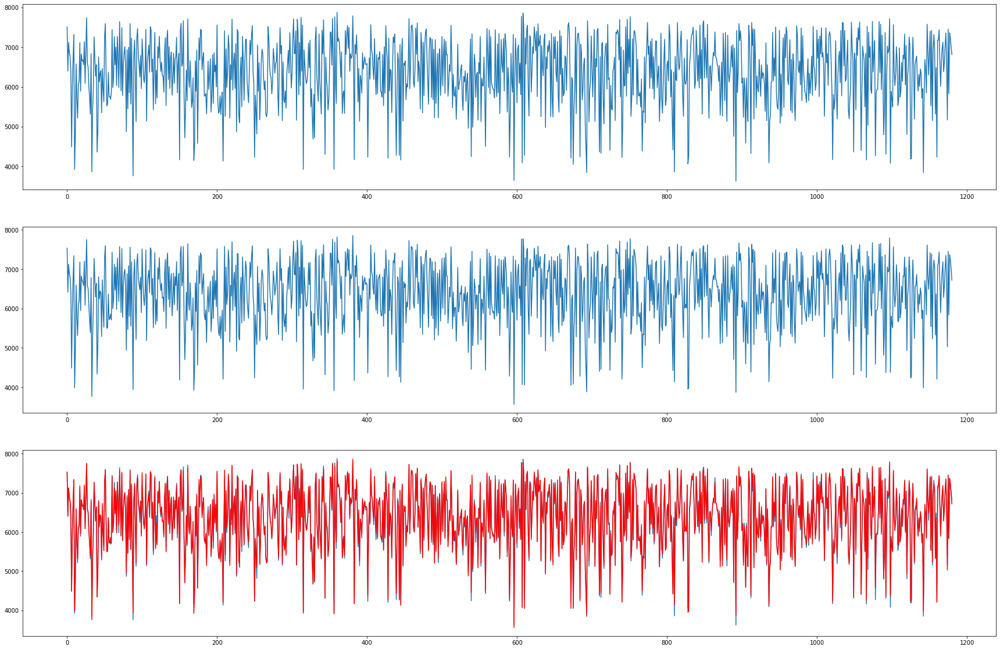

MAPE:0.860127866268158 RMSE:71.99656677246094 R2:0.9927112460136414


In [49]:
eval(MAPE,RMSE,R2,medium_target_test_loader,M1_ANN_medium,5)

In [50]:
train(optimizer_ANN_M1_large ,RMSE,large_target_train_loader,M1_ANN_large)

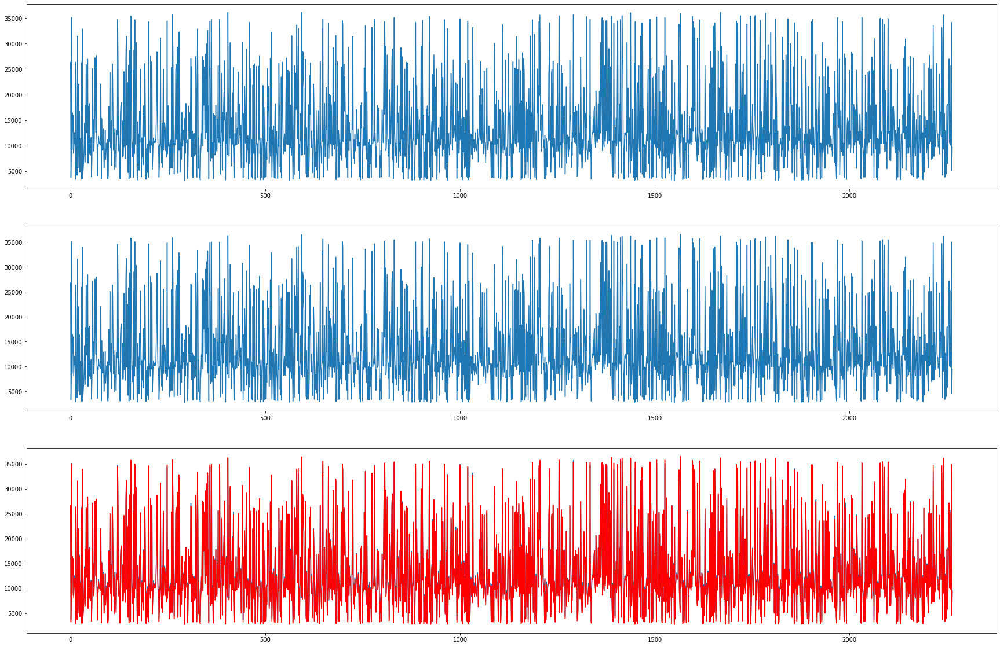

MAPE:4.4082489013671875 RMSE:427.0629577636719 R2:0.9970318675041199


In [51]:
eval(MAPE,RMSE,R2,large_target_test_loader,M1_ANN_large,8)

LSTM

In [82]:
train(optimizer_LSTM_M1_small,RMSE,small_target_train_loader,M1_LSTM_small,type = 'lstm')

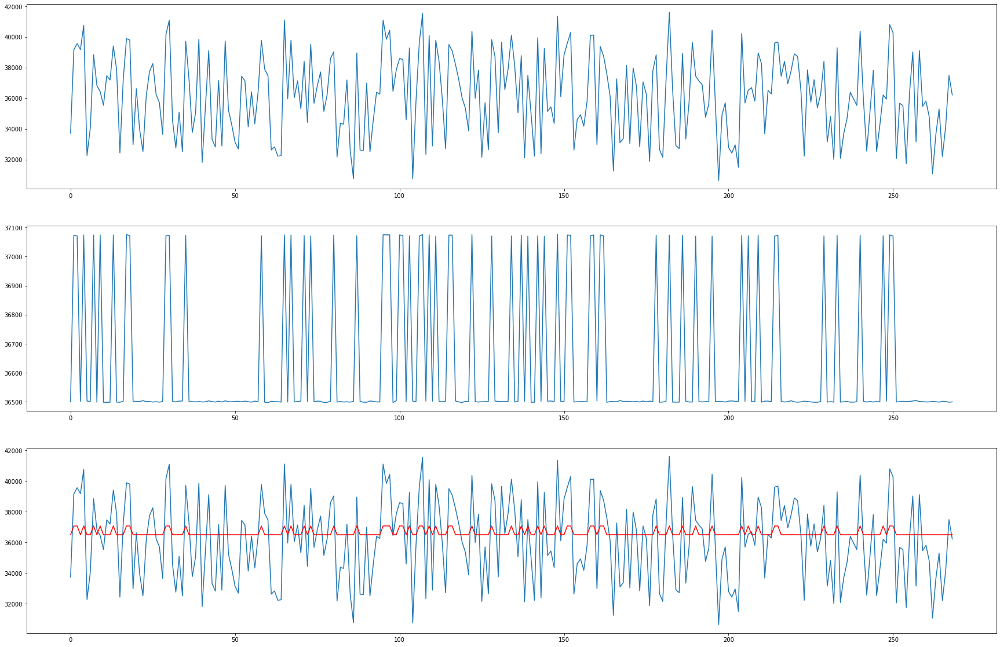

MAPE:5.927707195281982 RMSE:2589.8671875 R2:0.08073282241821289


In [84]:
eval(MAPE,RMSE,R2,small_target_test_loader,M1_LSTM_small,2,type = 'lstm')

In [ ]:
train(optimizer_LSTM_M1_medium,RMSE,medium_target_train_loader,M1_LSTM_medium,type = 'lstm')

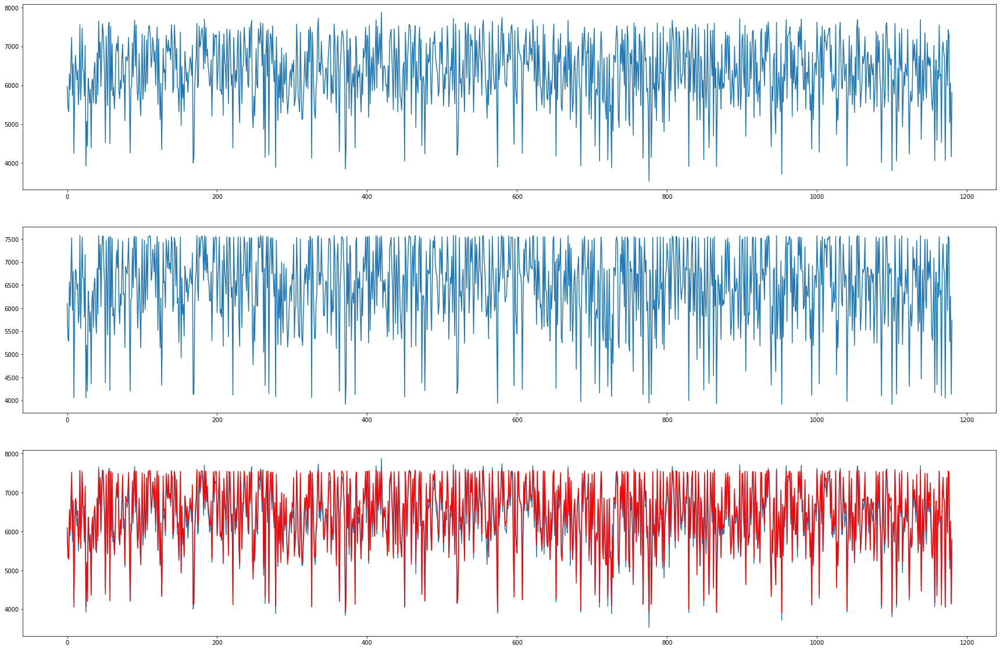

MAPE:2.310885190963745 RMSE:184.0039520263672 R2:0.9527368545532227


In [ ]:
eval(MAPE,RMSE,R2,medium_target_test_loader,M1_LSTM_medium,5,type = 'lstm')

In [ ]:
train(optimizer_LSTM_M1_large,RMSE,large_target_train_loader,M1_LSTM_large,type = 'lstm')

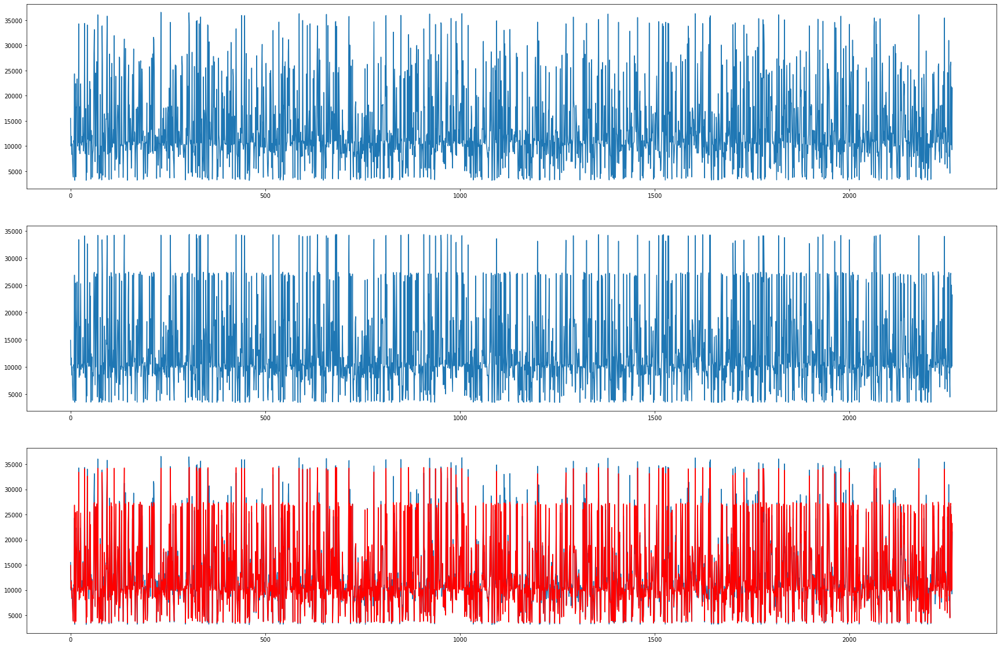

MAPE:6.135857105255127 RMSE:1155.0897216796875 R2:0.9783942699432373


In [ ]:
eval(MAPE,RMSE,R2,large_target_test_loader,M1_LSTM_large,8,type = 'lstm')

M2 

ANN

In [52]:
train(optimizer_M2_ANN_pretrain_small,RMSE,small_source_1_loader,M2_ANN_small)
train(optimizer_M2_ANN_finetune_small,RMSE,small_target_train_loader,M2_ANN_small)

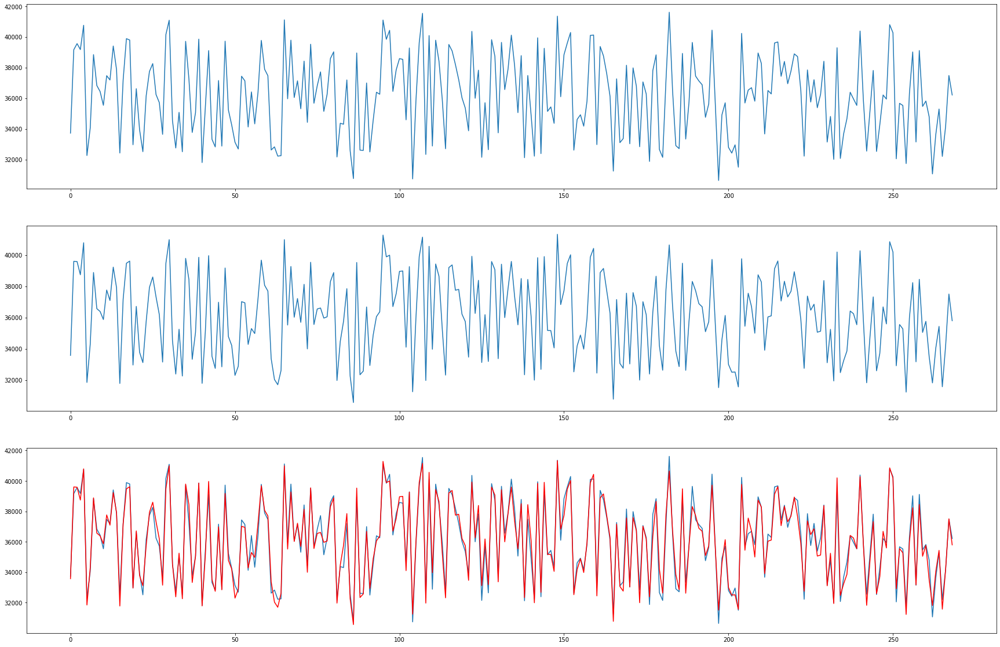

MAPE:1.0501712560653687 RMSE:488.22265625 R2:0.9673320055007935


In [53]:
eval(MAPE,RMSE,R2,small_target_test_loader,M2_ANN_small,2)

In [54]:
train(optimizer_M2_ANN_pretrain_medium,RMSE,medium_source_1_loader,M2_ANN_medium)
train(optimizer_M2_ANN_finetune_medium,RMSE,medium_target_train_loader,M2_ANN_medium)

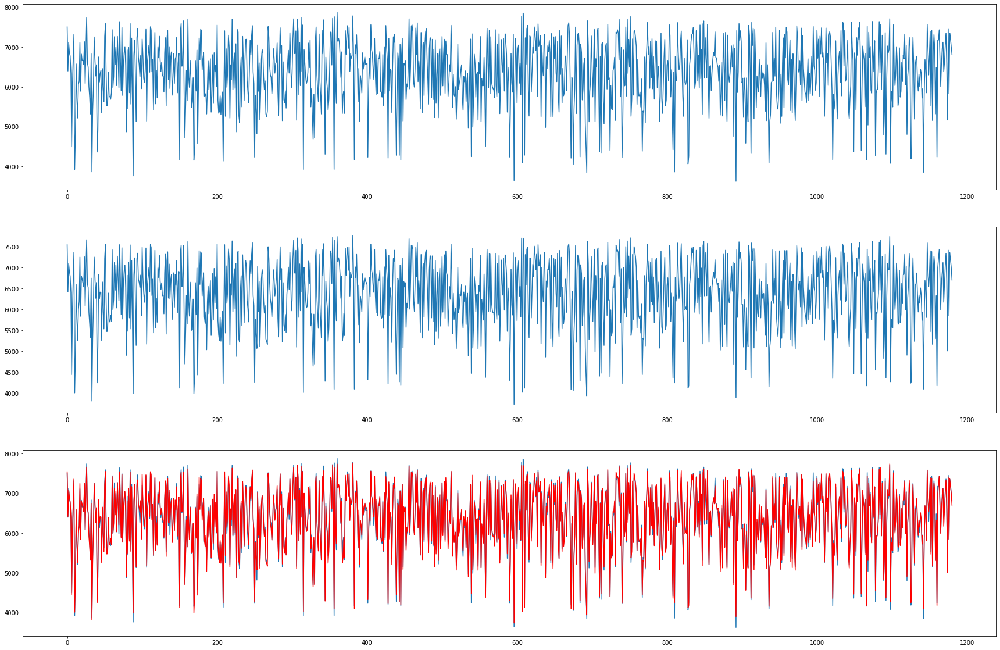

MAPE:1.025822401046753 RMSE:84.04252624511719 R2:0.9900681972503662


In [55]:
eval(MAPE,RMSE,R2,medium_target_test_loader,M2_ANN_medium,5)

In [56]:
train(optimizer_M2_ANN_pretrain_large,RMSE,large_source_1_loader,M2_ANN_large)
train(optimizer_M2_ANN_finetune_large,RMSE,large_target_train_loader,M2_ANN_large)

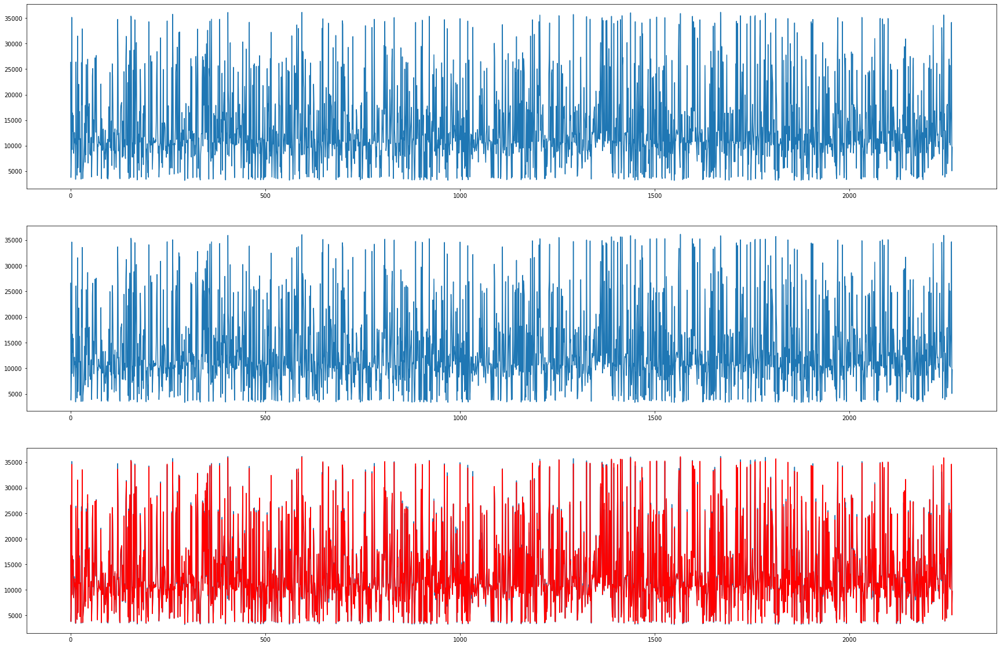

MAPE:1.5048176050186157 RMSE:293.0276184082031 R2:0.9986026287078857


In [57]:
eval(MAPE,RMSE,R2,large_target_test_loader,M2_ANN_large,8)

LSTM

In [ ]:
train(optimizer_M2_LSTM_pretrain_small,RMSE,small_source_1_loader,M2_LSTM_small,type = 'lstm')
train(optimizer_M2_LSTM_finetune_small,RMSE,small_target_train_loader,M2_LSTM_small,type = 'lstm')

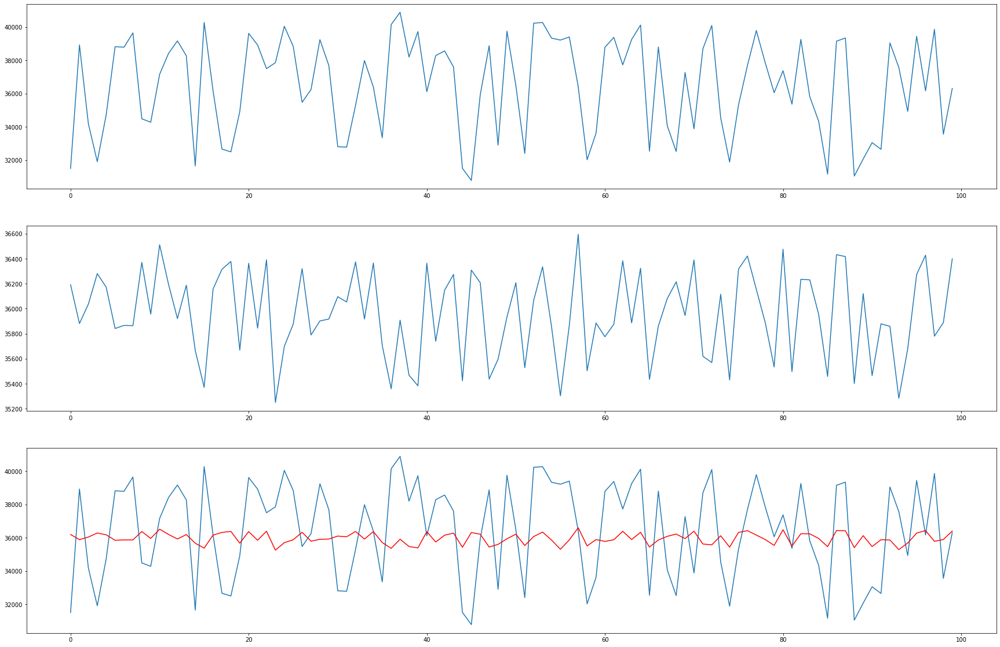

MAPE:6.856819152832031 RMSE:2856.701904296875 R2:-0.013221502304077148


In [ ]:
eval(MAPE,RMSE,R2,small_target_test_loader,M2_LSTM_small,2,type = 'lstm')

In [81]:
train(optimizer_M2_LSTM_pretrain_medium,RMSE,medium_source_1_loader,M2_LSTM_medium,type = 'lstm')
train(optimizer_M2_LSTM_finetune_medium,RMSE,medium_target_train_loader,M2_LSTM_medium,type = 'lstm')

KeyboardInterrupt: ignored

In [ ]:
eval(MAPE,RMSE,R2,medium_target_test_loader,M2_LSTM_medium,5,type = 'lstm')

In [ ]:
train(optimizer_M2_LSTM_pretrain_large,RMSE,large_source_1_loader,M2_LSTM_large,type = 'lstm')
train(optimizer_M2_LSTM_finetune_large,RMSE,large_target_train_loader,M2_LSTM_large,type = 'lstm')

In [ ]:
eval(MAPE,RMSE,R2,large_target_test_loader,M2_LSTM_large,8,type = 'lstm')

M3

ANN

In [58]:
train(optimizer_M3_ANN_pretrain_small,RMSE,small_source_2_loader,M3_ANN_small)
train(optimizer_M3_ANN_finetune_small,RMSE,small_target_train_loader,M3_ANN_small)

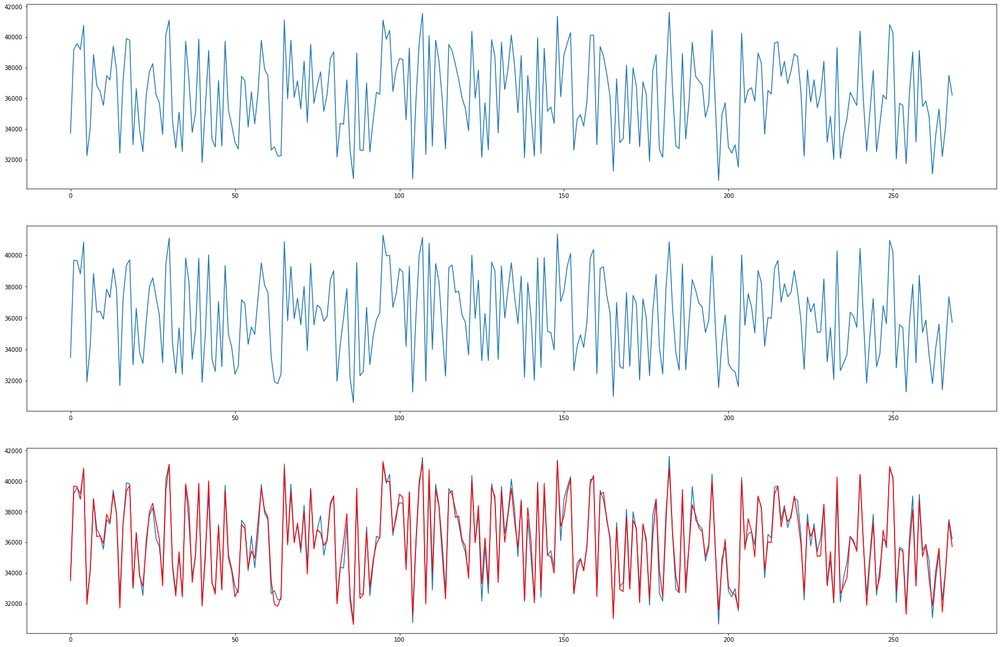

MAPE:1.0674529075622559 RMSE:491.53411865234375 R2:0.966887354850769


In [76]:
eval(MAPE,RMSE,R2,small_target_test_loader,M3_ANN_small,2)

In [60]:
train(optimizer_M3_ANN_pretrain_medium,RMSE,medium_source_2_loader,M3_ANN_medium)
train(optimizer_M3_ANN_finetune_medium,RMSE,medium_target_train_loader,M3_ANN_medium)

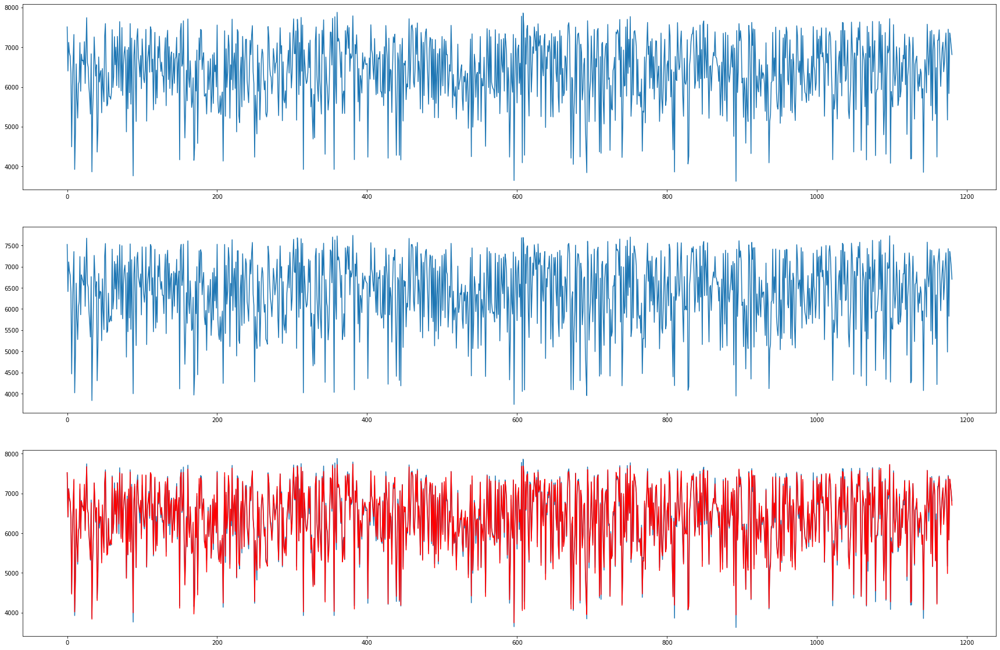

MAPE:0.989446759223938 RMSE:80.94171905517578 R2:0.9907875657081604


In [61]:
eval(MAPE,RMSE,R2,medium_target_test_loader,M3_ANN_medium,5)

In [62]:
train(optimizer_M3_ANN_pretrain_large,RMSE,large_source_2_loader,M3_ANN_large)
train(optimizer_M3_ANN_finetune_large,RMSE,large_target_train_loader,M3_ANN_large)

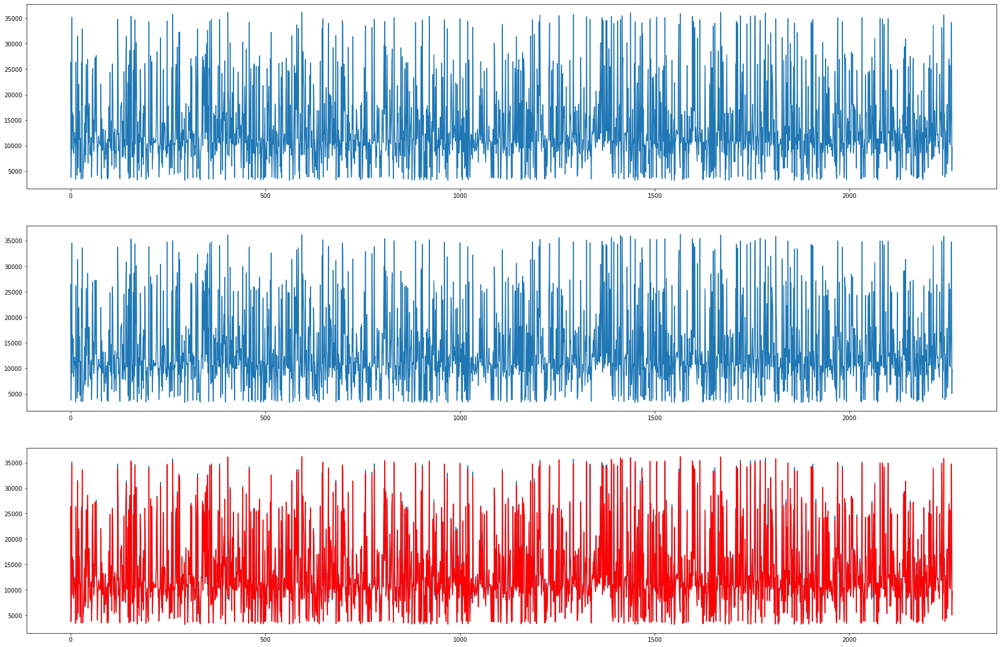

MAPE:1.4593043327331543 RMSE:308.00140380859375 R2:0.9984561800956726


In [63]:
eval(MAPE,RMSE,R2,large_target_test_loader,M3_ANN_large,8)

LSTM

In [ ]:
train(optimizer_M3_LSTM_pretrain_small,RMSE,small_source_2_loader,M3_LSTM_small,type = 'lstm')
train(optimizer_M3_LSTM_finetune_small,RMSE,small_target_train_loader,M3_LSTM_small,type = 'lstm')

In [ ]:
eval(MAPE,RMSE,R2,small_target_test_loader,M3_LSTM_small,2,type = 'lstm')

In [ ]:
train(optimizer_M3_LSTM_pretrain_medium,RMSE,medium_source_2_loader,M3_LSTM_medium,type = 'lstm')
train(optimizer_M3_LSTM_finetune_medium,RMSE,medium_target_train_loader,M3_LSTM_medium,type = 'lstm')

In [ ]:
eval(MAPE,RMSE,R2,medium_target_test_loader,M3_LSTM_medium,5,type = 'lstm')

In [ ]:
train(optimizer_M3_LSTM_pretrain_large,RMSE,large_source_2_loader,M3_LSTM_large,type = 'lstm')
train(optimizer_M3_LSTM_finetune_large,RMSE,large_target_train_loader,M3_LSTM_large,type = 'lstm')

In [ ]:
eval(MAPE,RMSE,R2,large_target_test_loader,M3_LSTM_large,8,type = 'lstm')

M4

ANN

In [64]:
#small
train(optimizer_M4_ANN_pretrain_1_small,RMSE,small_source_1_loader,M4_ANN_small)
train(optimizer_M4_ANN_pretrain_2_small,RMSE,small_source_2_loader,M4_ANN_small)
train(optimizer_M4_ANN_finetune_small,RMSE,small_target_train_loader,M4_ANN_small)

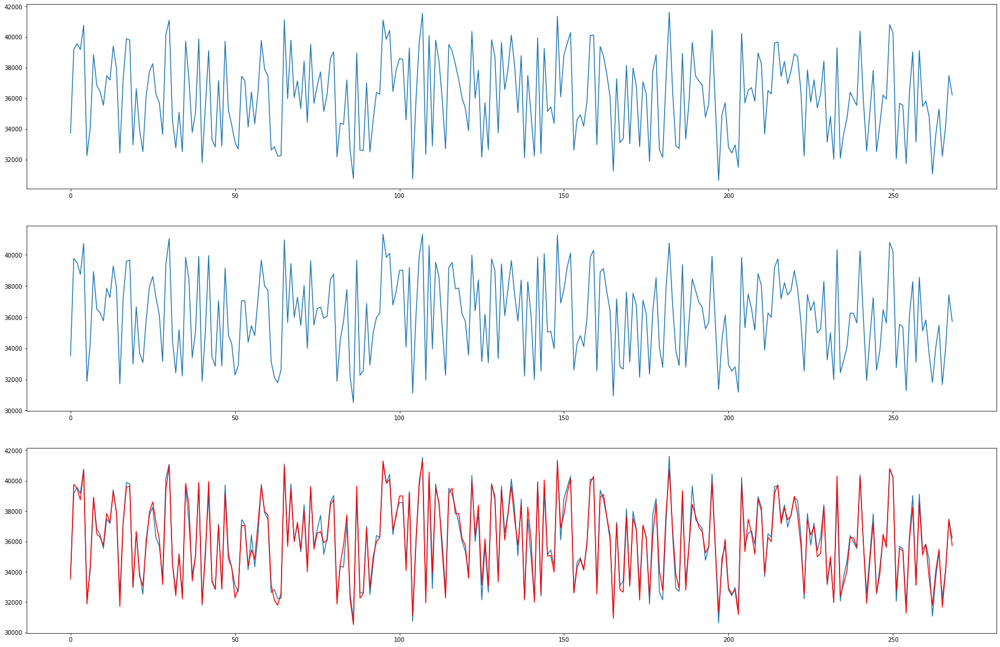

MAPE:1.0139527320861816 RMSE:464.4837341308594 R2:0.9704316258430481


In [65]:
eval(MAPE,RMSE,R2,small_target_test_loader,M4_ANN_small,2)

In [66]:
#medium
train(optimizer_M4_ANN_pretrain_1_medium,RMSE,medium_source_1_loader,M4_ANN_medium)
train(optimizer_M4_ANN_pretrain_2_medium,RMSE,medium_source_2_loader,M4_ANN_medium)
train(optimizer_M4_ANN_finetune_medium,RMSE,medium_target_train_loader,M4_ANN_medium)

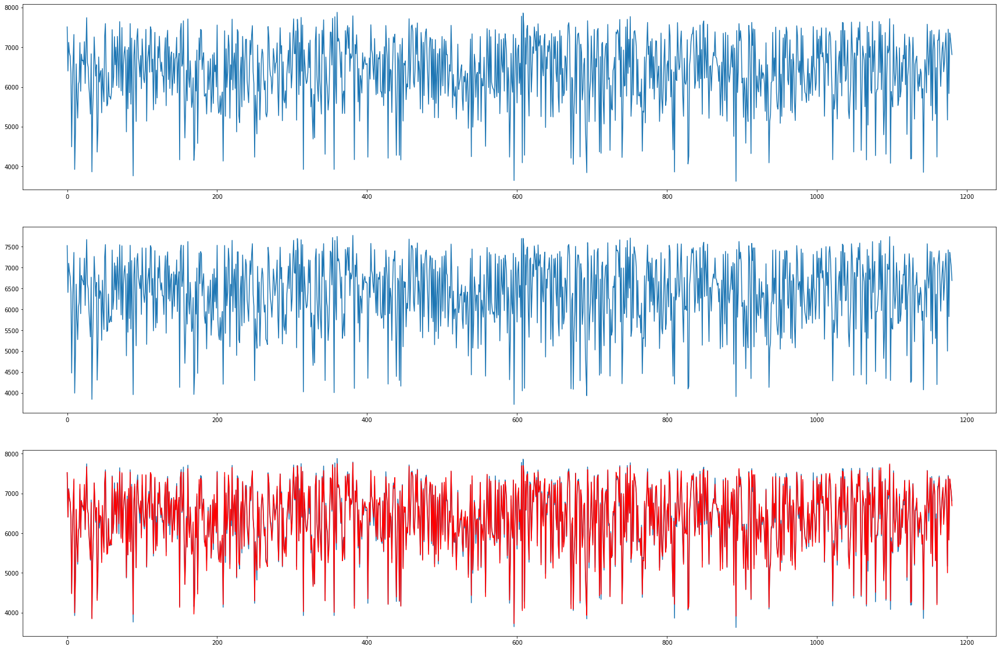

MAPE:0.9529731869697571 RMSE:78.216552734375 R2:0.9913974404335022


In [77]:
eval(MAPE,RMSE,R2,medium_target_test_loader,M4_ANN_medium,5)

In [68]:
#large
train(optimizer_M4_ANN_pretrain_1_large,RMSE,large_source_1_loader,M4_ANN_large)
train(optimizer_M4_ANN_pretrain_2_large,RMSE,large_source_2_loader,M4_ANN_large)
train(optimizer_M4_ANN_finetune_large,RMSE,large_target_train_loader,M4_ANN_large)

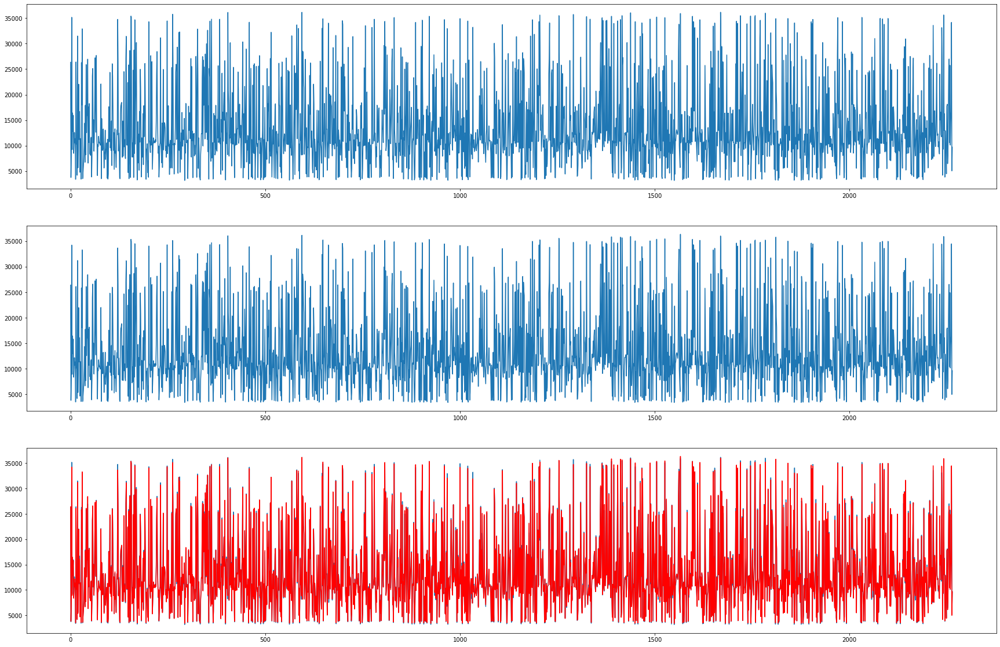

MAPE:1.6635605096817017 RMSE:293.427001953125 R2:0.9985988140106201


In [69]:
eval(MAPE,RMSE,R2,large_target_test_loader,M4_ANN_large,8)

LSTM

In [ ]:
train(optimizer_M4_LSTM_pretrain_1_small,RMSE,small_source_1_loader,M4_LSTM_small,type = 'lstm')
train(optimizer_M4_LSTM_pretrain_2_small,RMSE,small_source_2_loader,M4_LSTM_small,type = 'lstm')
train(optimizer_M4_LSTM_finetune_small,RMSE,small_target_train_loader,M4_LSTM_small,type = 'lstm')

In [ ]:
eval(MAPE,RMSE,R2,small_target_test_loader,M4_LSTM_small,2,type = 'lstm')

In [ ]:
train(optimizer_M4_LSTM_pretrain_1_medium,RMSE,medium_source_1_loader,M4_LSTM_medium,type = 'lstm')
train(optimizer_M4_LSTM_pretrain_2_medium,RMSE,medium_source_2_loader,M4_LSTM_medium,type = 'lstm')
train(optimizer_M4_LSTM_finetune_medium,RMSE,medium_target_train_loader,M4_LSTM_medium,type = 'lstm')

In [ ]:
eval(MAPE,RMSE,R2,medium_target_test_loader,M4_LSTM_medium,5,type ='lstm')

In [ ]:
train(optimizer_M4_LSTM_pretrain_1_large,RMSE,large_source_1_loader,M4_LSTM_large,type = 'lstm')
train(optimizer_M4_LSTM_pretrain_2_large,RMSE,large_source_2_loader,M4_LSTM_large,type = 'lstm')
train(optimizer_M4_LSTM_finetune_large,RMSE,large_target_train_loader,M4_LSTM_large,type = 'lstm')

In [ ]:
eval(MAPE,RMSE,R2,large_target_test_loader,M4_LSTM_large,8,type = 'lstm')

M5

ANN


In [70]:
#small
train(optimizer_M5_ANN_pretrain_1_small,RMSE,small_source_1_loader,M5_ANN_small)
first_layer_small = next(iter(M5_ANN_small.children())) 
for i in first_layer_small.parameters():
  i.requires_grad = False
train(optimizer_M5_ANN_pretrain_2_small,RMSE,small_source_2_loader,M5_ANN_small)
train(optimizer_M5_ANN_finetune_small,RMSE,small_target_train_loader,M5_ANN_small)

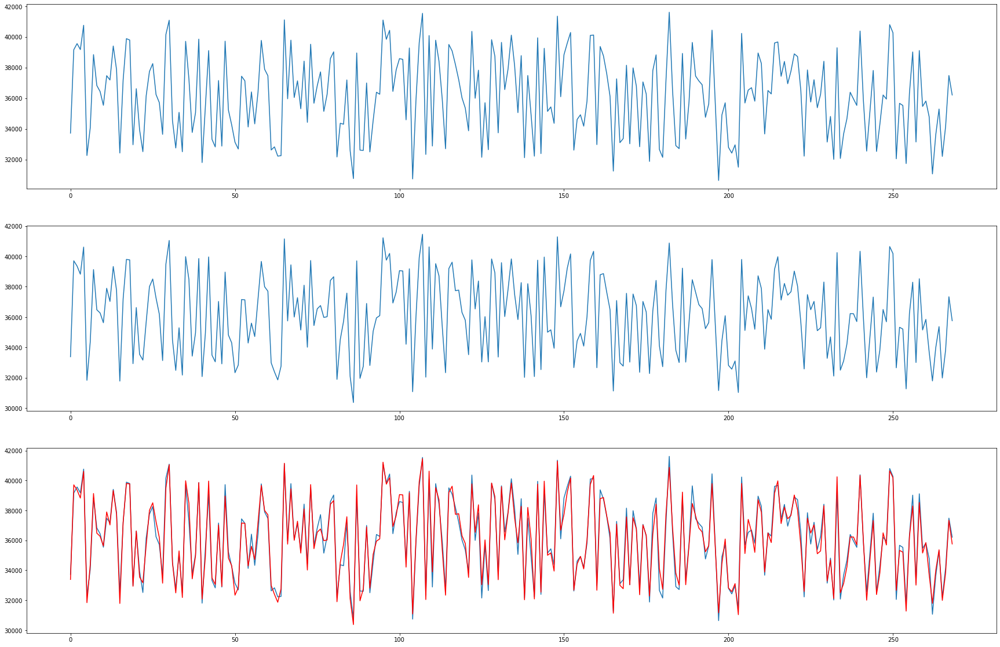

MAPE:1.009621500968933 RMSE:456.07568359375 R2:0.9714924097061157


In [78]:
eval(MAPE,RMSE,R2,small_target_test_loader,M5_ANN_small,2)

In [72]:
#medium
train(optimizer_M5_ANN_pretrain_1_medium,RMSE,medium_source_1_loader,M5_ANN_medium)
first_layer_medium = next(iter(M5_ANN_medium.children())) 
for i in first_layer_medium.parameters():
  i.requires_grad = False
train(optimizer_M5_ANN_pretrain_2_medium,RMSE,medium_source_2_loader,M5_ANN_medium)
train(optimizer_M5_ANN_finetune_medium,RMSE,medium_target_train_loader,M5_ANN_medium)

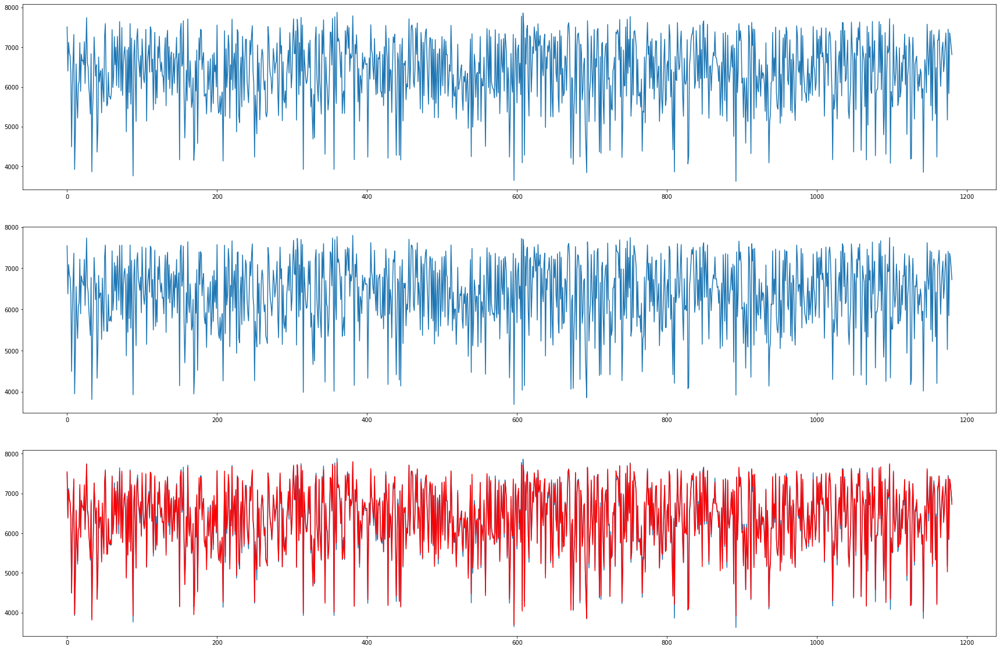

MAPE:0.9072614908218384 RMSE:76.07221984863281 R2:0.9918626546859741


In [73]:
eval(MAPE,RMSE,R2,medium_target_test_loader,M5_ANN_medium,5)

In [74]:
#large
train(optimizer_M5_ANN_pretrain_1_large,RMSE,large_source_1_loader,M5_ANN_large)
first_layer_large = next(iter(M5_ANN_large.children())) 
for i in first_layer_large.parameters():
  i.requires_grad = False
train(optimizer_M5_ANN_pretrain_2_large,RMSE,large_source_2_loader,M5_ANN_large)
train(optimizer_M5_ANN_finetune_large,RMSE,large_target_train_loader,M5_ANN_large)

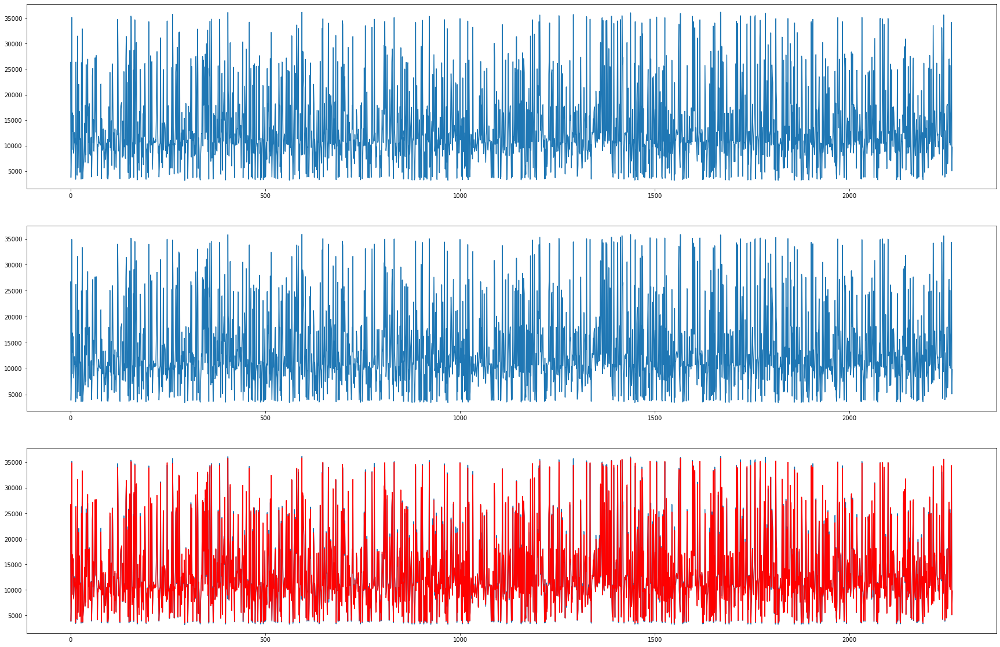

MAPE:2.069565773010254 RMSE:352.1999816894531 R2:0.9979812502861023


In [75]:
eval(MAPE,RMSE,R2,large_target_test_loader,M5_ANN_large,8)

LSTM

In [ ]:
# a = iter(M5_LSTM_small.LSTM_layer.parameters())
# for i in enumerate(a):
#   print(i)

In [ ]:
train(optimizer_M5_LSTM_pretrain_1_small,RMSE,small_source_1_loader,M5_LSTM_small,type = 'lstm')

a = iter(M5_LSTM_small.LSTM_layer.parameters())
for idx,i in enumerate(a):
  if(idx == 4):
    break
  i.requires_grad =False

train(optimizer_M5_LSTM_pretrain_2_small,RMSE,small_source_2_loader,M5_LSTM_small,type = 'lstm')
train(optimizer_M5_LSTM_finetune_small,RMSE,small_target_train_loader,M5_LSTM_small,type = 'lstm')

In [ ]:
eval(MAPE,RMSE,R2,small_target_test_loader,M5_LSTM_small,2,type = 'lstm')

In [ ]:
train(optimizer_M5_LSTM_pretrain_1_medium,RMSE,medium_source_1_loader,M5_LSTM_medium)

a = iter(M5_LSTM_medium.LSTM_layer.parameters())
for idx,i in enumerate(a):
  if(idx == 4):
    break
  i.requires_grad =False

train(optimizer_M5_LSTM_pretrain_2_medium,RMSE,medium_source_2_loader,M5_LSTM_medium)
train(optimizer_M5_LSTM_finetune_medium,RMSE,medium_target_train_loader,M5_LSTM_medium)

In [ ]:
eval(MAPE,RMSE,R2,medium_target_test_loader,M5_LSTM_medium,5,type ='lstm')

In [ ]:
train(optimizer_M5_LSTM_pretrain_1_large,RMSE,large_source_1_loader,M5_LSTM_large,type = 'lstm')

a = iter(M5_LSTM_large.LSTM_layer.parameters())
for idx,i in enumerate(a):
  if(idx == 4):
    break
  i.requires_grad =False

train(optimizer_M5_LSTM_pretrain_2_large,RMSE,large_source_2_loader,M5_LSTM_large,type = 'lstm')
train(optimizer_M5_LSTM_finetune_large,RMSE,large_target_train_loader,M5_LSTM_large,type = 'lstm')

In [ ]:
eval(MAPE,RMSE,R2,large_target_test_loader,M5_LSTM_large,8,type = 'lstm')